# **Visualiser des images: partie 1**

## Introduction à l'analyse des images - 32M7132

*Adrien Jeanrenaud (adrien.jeanrenaud@unige.ch)*

<div class="alert alert-block alert-info">
<b>Visualiser des images partie 1</b> : dernière étape de notre voyage des le traitement numériques des images en deux dimensions. Après avoir traité nos images et en avoir extrait des informations, il est nécessaire de les rendre visibles. Python permet de visualiser les images en quantité. La manière dont elles peuvent être disposées permet également de retirer des informations
</div>

## **Plan du cours**

> **Corrigé de l'exercice**
> * Du dossier au notebook
> * Visualiser avec les informations

> **Visualiser avec matplotlib**
> * Visualiser un boucle
> * Les images sur un graphique
> * Visualiser l'image et ses informations
> * Enregistrer ses visualisation 

> **Visualiser en mosaïque**
> * Une mosïque d'images redimensionnées
> * Concaténation verticale
> * Concaténation horizontale
> * Une fonction pour faire des mosaïques ?


In [1]:
# importer les librairies nécessaires

import numpy as np
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt

## **Corrigé de l'exercice**

Avant de corriger l'exercice, revenons sur le contenu de la semaine dernière.

### Du dossier au notebook

D'abord un petit rappel sur la fonction qui permet d'importer les images depuis un dossier sur notre notebook avec Python (si nécessaire).

In [2]:
def importer_images(path):
    
    liste_images = []
    ext = [".jpeg", ".png", ".jpg"]
    dossier = os.listdir(path)
    for files in dossier:
        if files.endswith(tuple(ext)):
            image_dossier = os.path.join(path, files)
            image = cv2.imread(image_dossier)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            liste_images.append(image)
    return liste_images

In [3]:
# dans quel dossier nous sommes

os.getcwd()

'/Users/jeanrenaud/Documents/UniGE/cours/cours_images_2022'

In [4]:
# fichiers et dossiers où nous sommes

os.listdir(".")

['matched_images_1.jpg',
 'kmeans6_1660508556086103215_LouisValtat_1908.jpg',
 'wikiart_scraped.csv',
 'cours7_filtres.ipynb',
 'matched_images_2.jpg',
 'fauvisme1904_1908.tpy',
 'kmeans6_9288238554096296368_HenriMatisse_1905.jpg',
 'matched_images_3.jpg',
 '.DS_Store',
 'color.ipynb',
 'matched_images_akaze.jpg',
 '18264555600660502829_AndreDerain_1906.jpg',
 'fauve_manuel.csv',
 'pasolini.jpg',
 'image_name.jpg',
 'cours6_manipulations_part2.ipynb',
 'export_explore',
 'fauve.jpg',
 'matched_images.jpg',
 'fauvisme_1904_1908',
 'p3.png',
 'name_1716482144495116223_SoniaDelaunay_1907.jpg',
 '3.2visualisations.ipynb',
 'cours10_visualisationsPart1.ipynb',
 'extensions.svg',
 'p2.png',
 'unige.jpg',
 'cours4-machine_image.ipynb',
 'kmeans6_846667021266391146_MauricedeVlaminck_1907.jpg',
 'haarcascade_frontalface_alt.xml',
 'p1.png',
 'concat.jpg',
 'cours5_manipulations_part1.ipynb',
 'cours_images_2022.txt',
 'export_explore.tpy',
 'name2_1716482144495116223_SoniaDelaunay_1907.jpg',
 '

In [5]:
# Utilisons la fonction

mes_images = importer_images(path="fauvisme1904_1908")

In [6]:
len(mes_images)

186

### Visualiser avec les informations

<div class="alert alert-block alert-warning">
<b>Exercice</b>: importer le dossier contenant les images fauves (en liant le chemin et le nom du fichier dans le tableur) et visualiser, à l'aide d'une boucle, uniquement les réalisation de Sonia Delaunay en imprimant également le nom de le titre de l'oeuvre ainsi que la date.</div>

In [7]:
# importer le csv

df = pd.read_csv("fauvisme1904_1908.csv", index_col=[0])

In [8]:
df.head()

,Style,Artwork,Artist,Date,Link,Filename
66424,Fauvism,Pierre with Wooden Horse,Henri Matisse,1904,https://uploads4.wikiart.org/images/henri-mati...,77871347142634460_HenriMatisse_1904.jpg
66425,Fauvism,"Place des Lices, St. Tropez",Henri Matisse,1904,https://uploads5.wikiart.org/images/henri-mati...,4691604282671572073_HenriMatisse_1904.jpg
66426,Fauvism,The Gardener,Maurice de Vlaminck,1904,https://uploads2.wikiart.org/images/maurice-de...,2760939596788927071_MauricedeVlaminck_1904.jpg
66427,Fauvism,Landscape near Chatou,Andre Derain,1904,https://uploads2.wikiart.org/images/andre-dera...,6725180920406777929_AndreDerain_1904.jpg
66428,Fauvism,Music,Andre Derain,1904,https://uploads2.wikiart.org/images/andre-dera...,7927828486181830000_AndreDerain_1904.jpg


In [9]:
# Appliquer un masque

dff = df[df["Artist"] == "Sonia Delaunay"]
dff.head()

,Style,Artwork,Artist,Date,Link,Filename
66560,Fauvism,Philomene,Sonia Delaunay,1907,https://uploads3.wikiart.org/images/sonia-dela...,1716482144495116223_SoniaDelaunay_1907.jpg
66561,Fauvism,Portrait of Philomene,Sonia Delaunay,1907,https://uploads6.wikiart.org/images/sonia-dela...,12692248801721896198_SoniaDelaunay_1907.jpg
66562,Fauvism,Sleeping girl,Sonia Delaunay,1907,https://uploads7.wikiart.org/images/sonia-dela...,12959314908433547397_SoniaDelaunay_1907.jpg


In [10]:
# Récupérer le nom des fichiers dans une liste

fname = dff.Filename.tolist()
fname

['1716482144495116223_SoniaDelaunay_1907.jpg',
 '12692248801721896198_SoniaDelaunay_1907.jpg',
 '12959314908433547397_SoniaDelaunay_1907.jpg']

In [11]:
# A chaque nom, ajouter le chemin qui mène au dossier

dname = "fauvisme1904_1908"
files = []
for i in fname:
    path = os.path.join(dname,i)
    files.append(path)
files

['fauvisme1904_1908/1716482144495116223_SoniaDelaunay_1907.jpg',
 'fauvisme1904_1908/12692248801721896198_SoniaDelaunay_1907.jpg',
 'fauvisme1904_1908/12959314908433547397_SoniaDelaunay_1907.jpg']

Date : 1907 
Artwork : Philomene


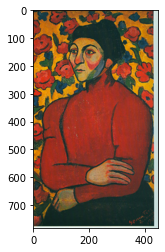

Date : 1907 
Artwork : Portrait of Philomene


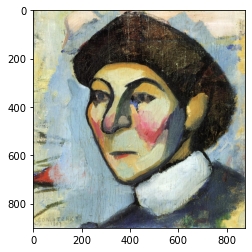

Date : 1907 
Artwork : Sleeping girl


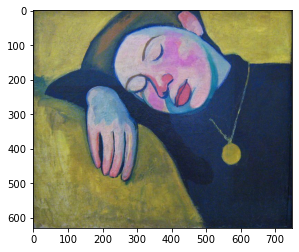

In [12]:
# Importer les images et les visualiser avec leur titre et date

dname = "fauvisme1904_1908"
for index, row in dff.iterrows():
    
    print(f"Date : {row.Date} \nArtwork : {row.Artwork}")
    
    
    path = os.path.join(dname, row.Filename)
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    plt.imshow(image)
    plt.show()

## **Visualiser avec matplotlib**

Matplotlib permet de visualiser les images en enfilade comme vu précédement. La librairie permet également de créer des graphiques auxquels il est possible d'ajouter des informations à l'image.

### Visualiser un boucle

Variante de visualisation en boucle

In [13]:
#Reprendre ma liste d'images

len(mes_images)

186

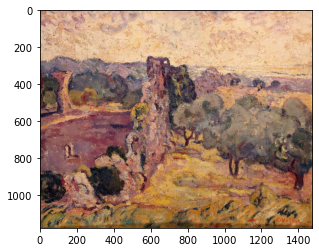

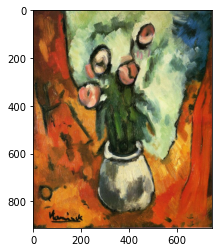

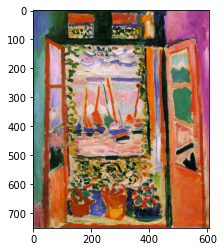

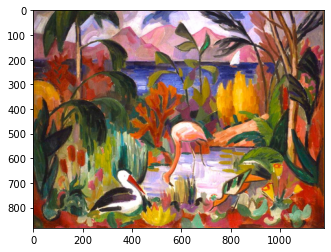

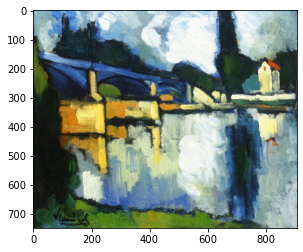

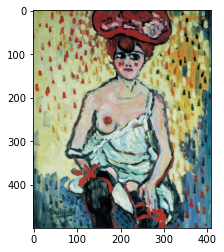

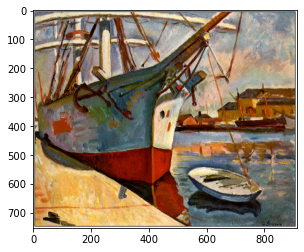

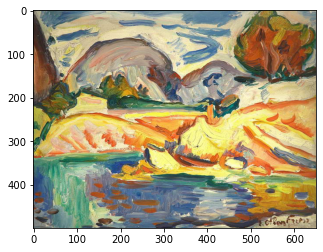

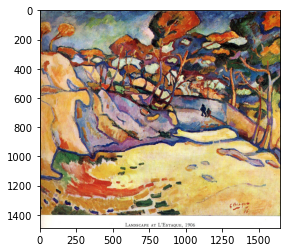

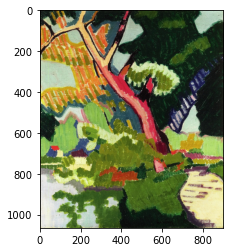

In [14]:
# Visualiser les 10 première

for i in mes_images[:10]:
    plt.imshow(i)
    plt.show()

### Les images sur un graphique

Cette librairie permet principalement de faire des graphiques. C'est une manière de visualiser les images

Text(0.5, 1.0, 'Image 2')

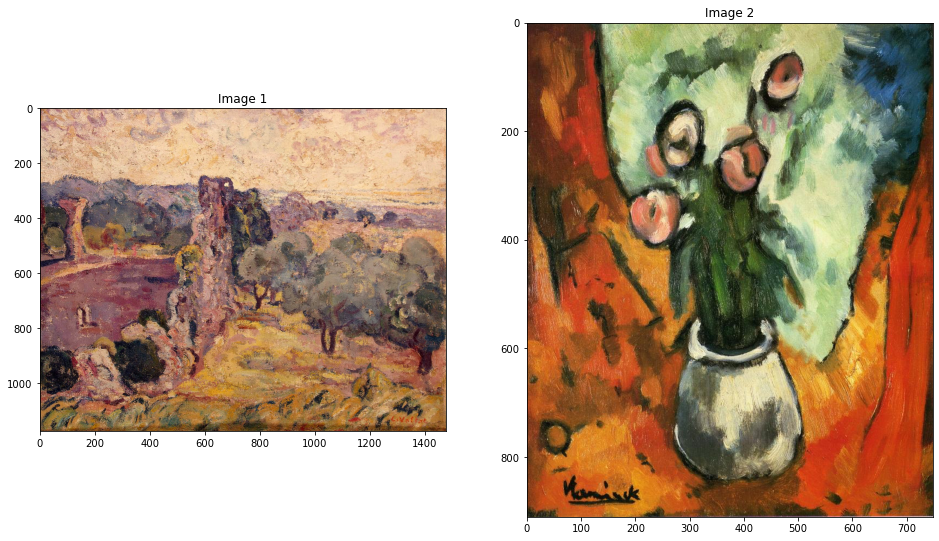

In [15]:
# visualiser deux images face à face

fig, ax = plt.subplots(1,2, figsize=(16,12))
ax[0].imshow(mes_images[0])
ax[0].set_title('Image 1')
ax[1].imshow(mes_images[1])
ax[1].set_title('Image 2')

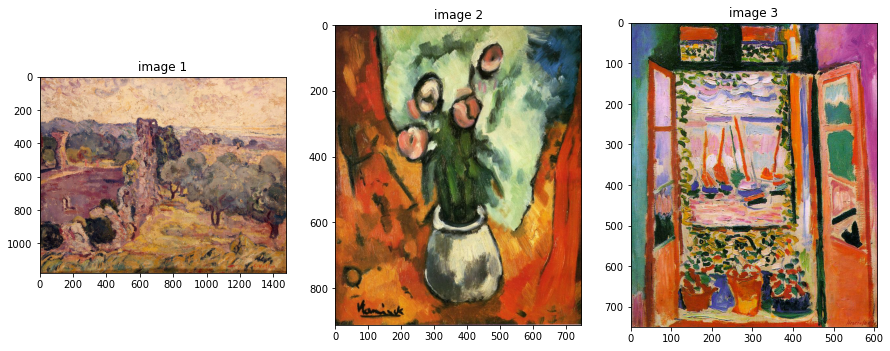

In [16]:
# visualiser 3 images

plt.figure(figsize=(15,10))
plt.subplot(131); plt.imshow(mes_images[0]); plt.title("image 1");
plt.subplot(132); plt.imshow(mes_images[1]); plt.title("image 2")
plt.subplot(133); plt.imshow(mes_images[2]); plt.title("image 3")
plt.show()

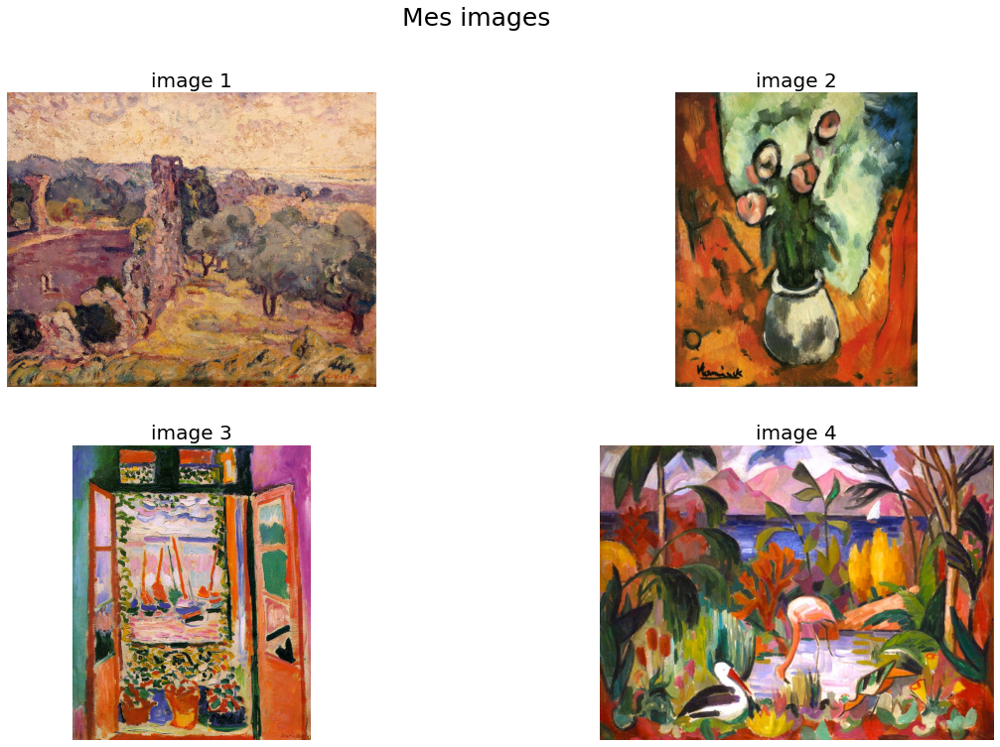

In [17]:
# visualiser 4 images

plt.figure(figsize=(20,12))
plt.subplot(221), plt.imshow(mes_images[0]), plt.axis('off'), plt.title('image 1', size=20)
plt.subplot(222), plt.imshow(mes_images[1]), plt.axis('off'), plt.title('image 2', size=20)
plt.subplot(223), plt.imshow(mes_images[2]), plt.axis('off'), plt.title('image 3', size=20)
plt.subplot(224), plt.imshow(mes_images[3]), plt.axis('off'), plt.title('image 4', size=20)
plt.suptitle('Mes images', size=25)
plt.show()

### Visualiser l'image et ses informations

La méthode précdente n'est pas très automatisé, surtout au niveau des métadonnées.

In [18]:
# On reprend notre dataframe avec Sonia Delaunay

dff

,Style,Artwork,Artist,Date,Link,Filename
66560,Fauvism,Philomene,Sonia Delaunay,1907,https://uploads3.wikiart.org/images/sonia-dela...,1716482144495116223_SoniaDelaunay_1907.jpg
66561,Fauvism,Portrait of Philomene,Sonia Delaunay,1907,https://uploads6.wikiart.org/images/sonia-dela...,12692248801721896198_SoniaDelaunay_1907.jpg
66562,Fauvism,Sleeping girl,Sonia Delaunay,1907,https://uploads7.wikiart.org/images/sonia-dela...,12959314908433547397_SoniaDelaunay_1907.jpg


In [19]:
dff.Filename.iloc[0]

'1716482144495116223_SoniaDelaunay_1907.jpg'

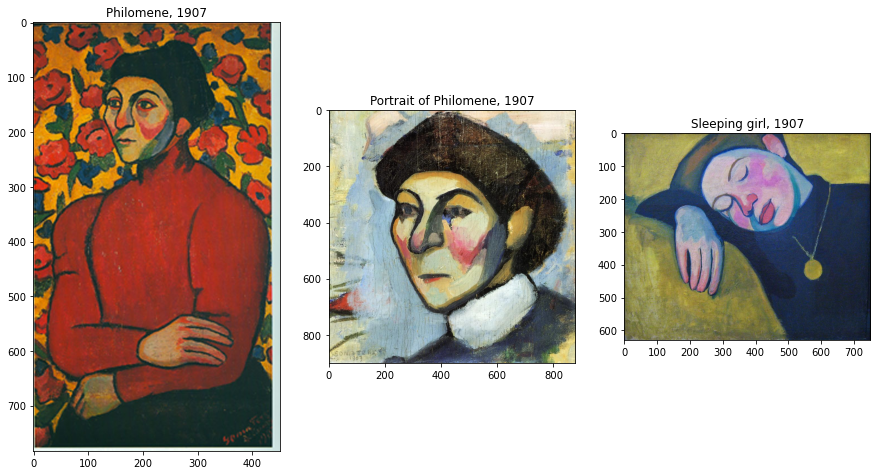

In [20]:
# visualiser mes 3 images

plt.figure(figsize=(15,10))
# 1 ligne, 3 colones
plt.subplot(131); plt.imshow(cv2.cvtColor(cv2.imread(os.path.join(dname, dff.Filename.iloc[0])), cv2.COLOR_BGR2RGB)); plt.title(f"{dff.Artwork.iloc[0]}, {dff.Date.iloc[0]}");
plt.subplot(132); plt.imshow(cv2.cvtColor(cv2.imread(os.path.join(dname, dff.Filename.iloc[1])), cv2.COLOR_BGR2RGB)); plt.title(f"{dff.Artwork.iloc[1]}, {dff.Date.iloc[1]}")
plt.subplot(133); plt.imshow(cv2.cvtColor(cv2.imread(os.path.join(dname, dff.Filename.iloc[2])), cv2.COLOR_BGR2RGB)); plt.title(f"{dff.Artwork.iloc[2]}, {dff.Date.iloc[2]}")
plt.show()

In [21]:
# Visualiser une image avec du texte

from PIL import Image
from PIL import ImageDraw

img = Image.open(os.path.join(dname, dff.Filename.iloc[0]))

txt = ImageDraw.Draw(img)

txt.text((28, 36), f"{dff.Artist.iloc[0]}, {dff.Artwork.iloc[0]}, {dff.Date.iloc[0]}", fill=(255, 255, 255))

img.show()


### Enregistrer ses visualisation 

In [22]:
# Visualiser une image avec du texte et enregistrer

from PIL import Image
from PIL import ImageDraw

img = Image.open(os.path.join(dname, dff.Filename.iloc[0]))

txt = ImageDraw.Draw(img)

txt.text((28, 36), f"{dff.Artist.iloc[0]}, {dff.Artwork.iloc[0]}, {dff.Date.iloc[0]}", fill=(255, 255, 255))

img.show()

img.save(f"name_{dff.Filename.iloc[0]}", dpi=(300,300))

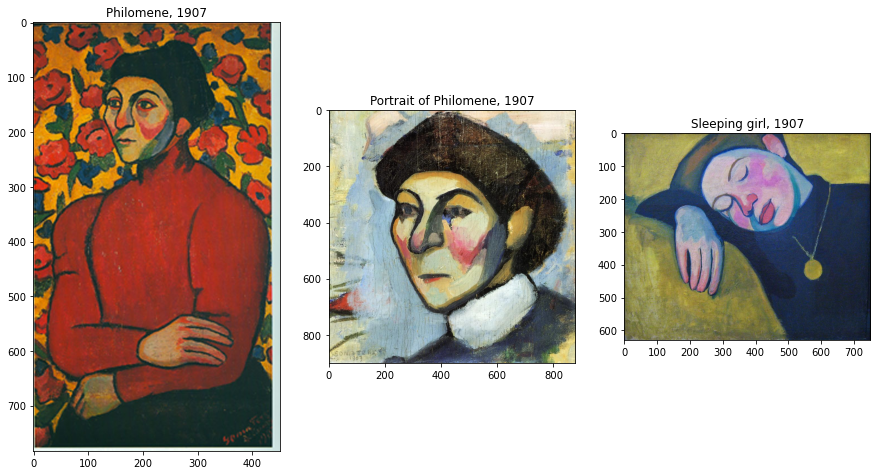

Text(0.5, 0.98, 'Sonia Delaunay')

<Figure size 432x288 with 0 Axes>

In [23]:
# visualiser mes 3 images et enregistrer

plt.figure(figsize=(15,10))
plt.subplot(131); plt.imshow(cv2.cvtColor(cv2.imread(os.path.join(dname, dff.Filename.iloc[0])), cv2.COLOR_BGR2RGB)); plt.title(f"{dff.Artwork.iloc[0]}, {dff.Date.iloc[0]}");
plt.subplot(132); plt.imshow(cv2.cvtColor(cv2.imread(os.path.join(dname, dff.Filename.iloc[1])), cv2.COLOR_BGR2RGB)); plt.title(f"{dff.Artwork.iloc[1]}, {dff.Date.iloc[1]}")
plt.subplot(133); plt.imshow(cv2.cvtColor(cv2.imread(os.path.join(dname, dff.Filename.iloc[2])), cv2.COLOR_BGR2RGB)); plt.title(f"{dff.Artwork.iloc[2]}, {dff.Date.iloc[2]}")
plt.show()
plt.suptitle('Sonia Delaunay', size=25)
#plt.savefig(f"name2_{dff.Filename.iloc[0]}", dpi=300)

## **Visualiser en mosaïque**
### Une mosaïque d'images redimensionnées

Pour pouvoir faire une mosaïque d'images, il faut au préalable les redimensionner en gardant les proportions: un petit rappel sur la manière pour le faire.

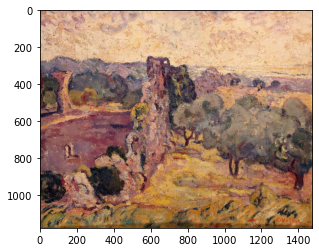

In [24]:
# reprenons notre images

plt.imshow(mes_images[0])
plt.show()

(500, 627, 3) (1177, 1476, 3)


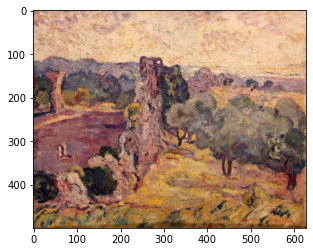

In [25]:
# Redimensionner en gardant les proportion

(h, w) = mes_images[0].shape[:2]
newh = 500
ratio = newh/ float(h)
newdim = (int(w * ratio), newh)
redim = cv2.resize(mes_images[0], newdim)
print(redim.shape, mes_images[0].shape)
plt.imshow(redim)
plt.show()

(911, 1142, 3) (1177, 1476, 3) (911, 748, 3)


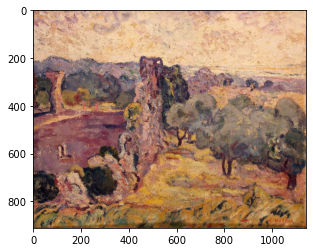

In [26]:
# Redimensionner une image avec une autre en gardant les proportion 

(h, w) = mes_images[0].shape[:2]
newh = mes_images[1].shape[0]
ratio = newh/ float(h)
newdim = (int(w * ratio), newh)
redim = cv2.resize(mes_images[0], newdim)
print(redim.shape, mes_images[0].shape, mes_images[1].shape)
plt.imshow(redim)
plt.show()

### Concaténation horizontale

Redimensionner les images selon leur hauteur permet de les concaténer horizontalement

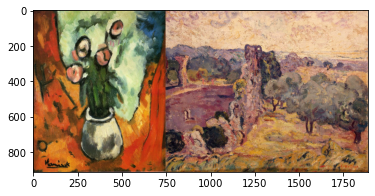

In [30]:
concat_h = cv2.hconcat([mes_images[1], redim])
plt.imshow(concat_h)
plt.show()

### Concaténation verticale

Redimensionner les images selon leur largeur permet de les concaténer verticalement

In [27]:
# avec deux images de dimensions différentes

print(mes_images[1].shape, mes_images[2].shape)

(911, 748, 3) (750, 607, 3)


In [112]:
w = mes_images[1].shape[1]
ratio = w/float(mes_images[2].shape[1])
newdim = (w, int(mes_images[2].shape[0]*ratio))
newdim

(748, 924)

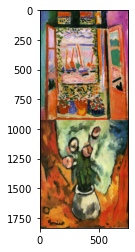

In [113]:
# Opérer la changement de dimension puis concatener

redim2 = cv2.resize(mes_images[2], newdim)
conc_h = cv2.vconcat([redim2, mes_images[1]])
plt.imshow(conc_h)
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

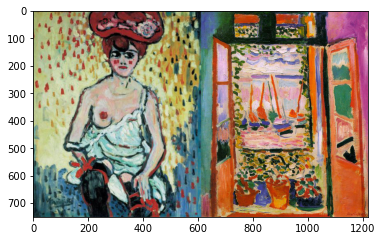

In [34]:
# si on met tout dans une cellule ?

img1 = mes_images[2]
img2 = mes_images[5]
filename = "concat.jpg"
h = img1.shape[0]
ratio = h/float(img2.shape[0])
newdim = (int(img2.shape[1]*ratio), h)
redim2 = cv2.resize(img2, newdim)
conc_h = cv2.hconcat([redim2, img1])
conc_hc = cv2.cvtColor(conc_h, cv2.COLOR_RGB2BGR)
#cv2.imwrite(filename, conc_hc)
plt.imshow(conc_h)
plt.show

**Et si on créait un script Python ?**

### Une fonction pour faire des mosaïques ?

<div class="alert alert-block alert-warning">
<b>Exercice</b>: créer une fonction qui prend en entrée le CSV, le nom d'un artiste (ici toujours Sonia Delaunay). La fonction doit concaténer horizontalement les images de l'artiste. En sortie l'image concaténée est enregistrée avec un message pour dire que tout s'est bien passée.</div>

### Level up

<div class="alert alert-block alert-warning">
<b>Exercice</b>: cette fois il s'agit de créer une mosaïque verticale et horizontale. Au terme, vous aurez une fonction qui prend comme arguments le nombre d'images par ligne, le CSV et le nom d'un artiste. Comme l'image doit être complète vous compléterez la ligne avec un rectangle de la couleur que vous voudrez. Evidemment, l'image doit être enregistrée à la fin.</div>

In [36]:
path="fauvisme1904_1908"
    
ext = [".png", ".jpg", ".jpeg"] #extensions
img_list = [] #liste vide pour les images
files = os.listdir(path) #une liste avec les fichiers dans un dossier
for img in files: # pour chaque fichier
    if img.endswith(tuple(ext)): # si le fichier termine par mon extension
        image_path = os.path.join(path, img) # tabulation après la fonction
        image = cv2.imread(image_path) # lire l'image
        img_list.append(image) # sauvegarder les images dans un dossier

if len(img_list)%4 == 0: #d'abord voir si c'est un multiple de 4

    for i in range(0, len(img_list)): 
        rows = len(img_list)//4 # division par 4 pour voir combien de lignes
        rows_list = [] #liste pour les lignes

        for i in range(0, len(img_list), 4): # séparer les lignes
            # avoir des listes pour chaque ligne + utiliser la fonction définie plus haut
            rows_list.append(hconcat_resize(img_list[i: i+4])) 

    nuages_de_mots = cv2.vconcat(rows_list) #figure finale 

else: # si on a pas un multiple de 4

    to_fill = 4 - (len(img_list)%4) # combien de place à remplir ?
    y = (img_list[0].shape)[1]*to_fill # en largeur il nous faut
    x = (img_list[0].shape)[0] # en hauteur il nous faut
    canvas = np.zeros([x,y,3],np.uint8) #on crée une forme 
    canvas.fill(255) #on ajoute le blanc

    # maintenant on peut faire notre montage
    last_row = img_list[-(len(img_list)%4):] # on extrait la dernière ligne
    last_row.append(canvas)
    last_row = cv2.hconcat(last_row, canvas) # ajout de la partie manquante à la dernière ligne

    other_rows = img_list[:-(len(img_list)%4)] # on pacte les premières

    # il faut concat les premières lignes
    firsts_rows = [] #liste pour les lignes
    for i in range(0, len(other_rows), 4): # séparer les lignes
        # avoir des listes pour chaque ligne + utiliser la fonction définie plus haut
        firsts_rows.append(hconcat_resize(other_rows[i: i+4])) 

    #ajout de la dernière ligne aux premières   
    firsts_rows.append(last_row)
    nuages_de_mots = cv2.vconcat(firsts_rows) #figure finale 

error: OpenCV(4.5.3) /Users/runner/miniforge3/conda-bld/libopencv_1630689587190/work/modules/core/src/matrix_operations.cpp:67: error: (-215:Assertion failed) src[i].dims <= 2 && src[i].rows == src[0].rows && src[i].type() == src[0].type() in function 'hconcat'


In [44]:
def hconcat_resize(img_list, 
                   interpolation 
                   = cv2.INTER_CUBIC):
      # take minimum hights
    h_min = min(img.shape[0] 
                for img in img_list)
      
    # image resizing 
    im_list_resize = [cv2.resize(img,
                       (int(img.shape[1] * h_min / img.shape[0]),
                        h_min), interpolation
                                 = interpolation) 
                      for img in img_list]
      
    # return final image
    return cv2.hconcat(im_list_resize)

In [116]:
path="fauvisme1904_1908"
n = 4
n_img = 40
newh = 600
neww = 2500
    
ext = [".png", ".jpg", ".jpeg"] #extensions
img_list = [] #liste vide pour les images
files = os.listdir(path) #une liste avec les fichiers dans un dossier
for img in files: # pour chaque fichier
    if img.endswith(tuple(ext)): # si le fichier termine par mon extension
        image_path = os.path.join(path, img) # tabulation après la fonction
        image = cv2.imread(image_path) # lire l'image
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        
        (h, w) = image.shape[:2]
        ratio = newh/ float(h)
        newdim = (int(w * ratio), newh)
        redim = cv2.resize(image, newdim)
        
        img_list.append(redim) # sauvegarder les images dans un dossier
        img_list = img_list[:n_img] 

if len(img_list)%n == 0: #d'abord voir si c'est un multiple de n
    for i in range(0, len(img_list)): 
        rows = len(img_list)//n # division par 4 pour voir combien de lignes
        rows_list = [] #liste pour les lignes
        for j in range(0, len(img_list), n): # séparer les lignes
            # avoir des listes pour chaque ligne + utiliser la fonction définie plus haut
            conc_h = cv2.hconcat(img_list[j: j+n])
            rows_list.append(conc_h)
            col_list=[]
            for k in rows_list:
                ratio2 = neww/float(k.shape[1])
                newdim2 = (neww, int(k.shape[0]*ratio))
                redim2 = cv2.resize(k, newdim2)
                col_list.append(redim2)

            mosaique = cv2.vconcat(col_list) #figure finale 

(600, 2531, 3)
(382, 2500, 3)
(600, 2531, 3)
(382, 2500, 3)
(600, 2723, 3)
(382, 2500, 3)
(600, 2531, 3)
(382, 2500, 3)
(600, 2723, 3)
(382, 2500, 3)
(600, 2399, 3)
(382, 2500, 3)
(600, 2531, 3)
(382, 2500, 3)
(600, 2723, 3)
(382, 2500, 3)
(600, 2399, 3)
(382, 2500, 3)
(600, 2453, 3)
(382, 2500, 3)
(600, 2531, 3)
(382, 2500, 3)
(600, 2723, 3)
(382, 2500, 3)
(600, 2399, 3)
(382, 2500, 3)
(600, 2453, 3)
(382, 2500, 3)
(600, 2799, 3)
(382, 2500, 3)
(600, 2531, 3)
(382, 2500, 3)
(600, 2723, 3)
(382, 2500, 3)
(600, 2399, 3)
(382, 2500, 3)
(600, 2453, 3)
(382, 2500, 3)
(600, 2799, 3)
(382, 2500, 3)
(600, 2740, 3)
(382, 2500, 3)
(600, 2531, 3)
(382, 2500, 3)
(600, 2723, 3)
(382, 2500, 3)
(600, 2399, 3)
(382, 2500, 3)
(600, 2453, 3)
(382, 2500, 3)
(600, 2799, 3)
(382, 2500, 3)
(600, 2740, 3)
(382, 2500, 3)
(600, 2446, 3)
(382, 2500, 3)
(600, 2531, 3)
(382, 2500, 3)
(600, 2723, 3)
(382, 2500, 3)
(600, 2399, 3)
(382, 2500, 3)
(600, 2453, 3)
(382, 2500, 3)
(600, 2799, 3)
(382, 2500, 3)
(600, 2740

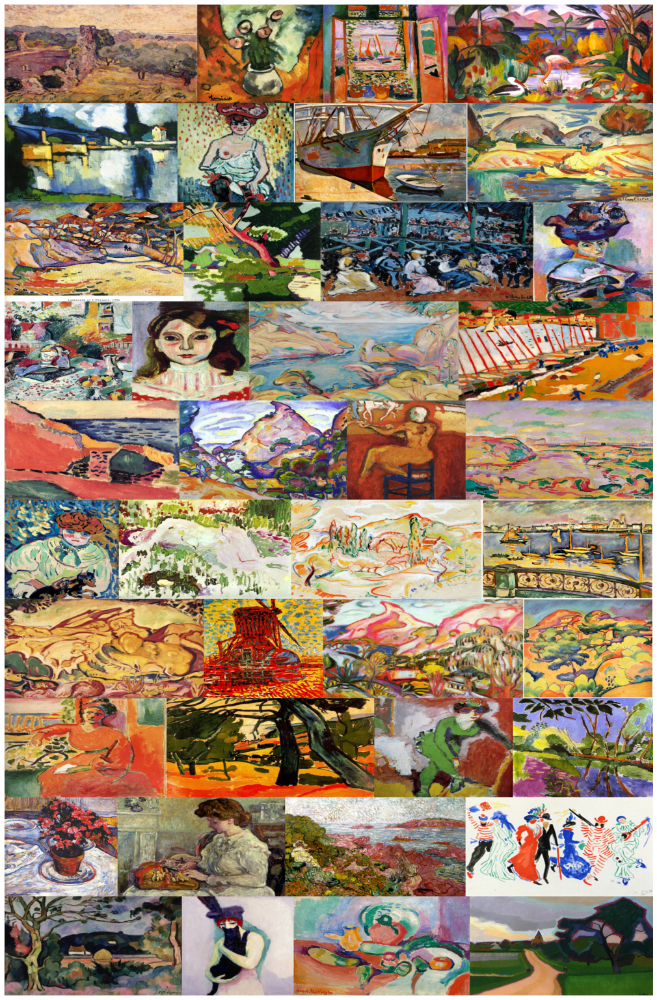

In [120]:
fig = plt.figure(figsize=(42,28))
plt.imshow(mosaique)
plt.axis('off')
plt.show()